# Artificial Intelligence Nanodegree

## Convolutional Neural Networks

## Project: Write an Algorithm for a Dog Identification App 

---

In this notebook, some template code has already been provided for you, and you will need to implement additional functionality to successfully complete this project. You will not need to modify the included code beyond what is requested. Sections that begin with **'(IMPLEMENTATION)'** in the header indicate that the following block of code will require additional functionality which you must provide. Instructions will be provided for each section, and the specifics of the implementation are marked in the code block with a 'TODO' statement. Please be sure to read the instructions carefully! 

> **Note**: Once you have completed all of the code implementations, you need to finalize your work by exporting the iPython Notebook as an HTML document. Before exporting the notebook to html, all of the code cells need to have been run so that reviewers can see the final implementation and output. You can then export the notebook by using the menu above and navigating to **File -> Download as -> HTML (.html)**. Include the finished document along with this notebook as your submission.

In addition to implementing code, there will be questions that you must answer which relate to the project and your implementation. Each section where you will answer a question is preceded by a **'Question X'** header. Carefully read each question and provide thorough answers in the following text boxes that begin with **'Answer:'**. Your project submission will be evaluated based on your answers to each of the questions and the implementation you provide.

>**Note:** Code and Markdown cells can be executed using the **Shift + Enter** keyboard shortcut.  Markdown cells can be edited by double-clicking the cell to enter edit mode.

The rubric contains _optional_ "Stand Out Suggestions" for enhancing the project beyond the minimum requirements. If you decide to pursue the "Stand Out Suggestions", you should include the code in this IPython notebook.



---
### Why We're Here 

In this notebook, you will make the first steps towards developing an algorithm that could be used as part of a mobile or web app.  At the end of this project, your code will accept any user-supplied image as input.  If a dog is detected in the image, it will provide an estimate of the dog's breed.  If a human is detected, it will provide an estimate of the dog breed that is most resembling.  The image below displays potential sample output of your finished project (... but we expect that each student's algorithm will behave differently!). 

![Sample Dog Output](images/sample_dog_output.png)

In this real-world setting, you will need to piece together a series of models to perform different tasks; for instance, the algorithm that detects humans in an image will be different from the CNN that infers dog breed.  There are many points of possible failure, and no perfect algorithm exists.  Your imperfect solution will nonetheless create a fun user experience!

### The Road Ahead

We break the notebook into separate steps.  Feel free to use the links below to navigate the notebook.

* [Step 0](#step0): Import Datasets
* [Step 1](#step1): Detect Humans
* [Step 2](#step2): Detect Dogs
* [Step 3](#step3): Create a CNN to Classify Dog Breeds (from Scratch)
* [Step 4](#step4): Use a CNN to Classify Dog Breeds (using Transfer Learning)
* [Step 5](#step5): Create a CNN to Classify Dog Breeds (using Transfer Learning)
* [Step 6](#step6): Write your Algorithm
* [Step 7](#step7): Test Your Algorithm

---
<a id='step0'></a>
## Step 0: Import Datasets

### Import Dog Dataset

In the code cell below, we import a dataset of dog images.  We populate a few variables through the use of the `load_files` function from the scikit-learn library:
- `train_files`, `valid_files`, `test_files` - numpy arrays containing file paths to images
- `train_targets`, `valid_targets`, `test_targets` - numpy arrays containing onehot-encoded classification labels 
- `dog_names` - list of string-valued dog breed names for translating labels

In [1]:
from sklearn.datasets import load_files       
from keras.utils import np_utils
import numpy as np
from glob import glob
import os

# define function to load train, test, and validation datasets
def load_dataset(path):
    data = load_files(path)
    dog_files = np.array(data['filenames'])
    dog_targets = np_utils.to_categorical(np.array(data['target']), 133)
    return dog_files, dog_targets

# load train, test, and validation datasets
train_files, train_targets = load_dataset('dogImages/train')
valid_files, valid_targets = load_dataset('dogImages/valid')
test_files, test_targets = load_dataset('dogImages/test')

# load list of dog names
dog_names = [item[20:-1] for item in sorted(glob("dogImages/train/*/"))]

# print statistics about the dataset
print('There are %d total dog categories.' % len(dog_names))
print('There are %s total dog images.\n' % len(np.hstack([train_files, valid_files, test_files])))
print('There are %d training dog images.' % len(train_files))
print('There are %d validation dog images.' % len(valid_files))
print('There are %d test dog images.'% len(test_files))

Using TensorFlow backend.


There are 133 total dog categories.
There are 8351 total dog images.

There are 6680 training dog images.
There are 835 validation dog images.
There are 836 test dog images.


### Import Human Dataset

In the code cell below, we import a dataset of human images, where the file paths are stored in the numpy array `human_files`.

In [2]:
import random
random.seed(8675309)

# load filenames in shuffled human dataset
human_files = np.array(glob("lfw/*/*"))
random.shuffle(human_files)

# print statistics about the dataset
print('There are %d total human images.' % len(human_files))

There are 13233 total human images.


---
<a id='step1'></a>
## Step 1: Detect Humans

We use OpenCV's implementation of [Haar feature-based cascade classifiers](http://docs.opencv.org/trunk/d7/d8b/tutorial_py_face_detection.html) to detect human faces in images.  OpenCV provides many pre-trained face detectors, stored as XML files on [github](https://github.com/opencv/opencv/tree/master/data/haarcascades).  We have downloaded one of these detectors and stored it in the `haarcascades` directory.

In the next code cell, we demonstrate how to use this detector to find human faces in a sample image.

Number of faces detected: 1


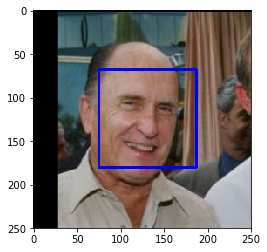

In [3]:
import cv2                
import matplotlib.pyplot as plt                        
%matplotlib inline                               

# extract pre-trained face detector
face_cascade = cv2.CascadeClassifier('haarcascades/haarcascade_frontalface_alt.xml')

# load color (BGR) image
img = cv2.imread(human_files[3])
# convert BGR image to grayscale
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# find faces in image
faces = face_cascade.detectMultiScale(gray)

# print number of faces detected in the image
print('Number of faces detected:', len(faces))

# get bounding box for each detected face
for (x,y,w,h) in faces:
    # add bounding box to color image
    cv2.rectangle(img,(x,y),(x+w,y+h),(255,0,0),2)
    
# convert BGR image to RGB for plotting
cv_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# display the image, along with bounding box
plt.imshow(cv_rgb)
plt.show()

Before using any of the face detectors, it is standard procedure to convert the images to grayscale.  The `detectMultiScale` function executes the classifier stored in `face_cascade` and takes the grayscale image as a parameter.  

In the above code, `faces` is a numpy array of detected faces, where each row corresponds to a detected face.  Each detected face is a 1D array with four entries that specifies the bounding box of the detected face.  The first two entries in the array (extracted in the above code as `x` and `y`) specify the horizontal and vertical positions of the top left corner of the bounding box.  The last two entries in the array (extracted here as `w` and `h`) specify the width and height of the box.

### Write a Human Face Detector

We can use this procedure to write a function that returns `True` if a human face is detected in an image and `False` otherwise.  This function, aptly named `face_detector`, takes a string-valued file path to an image as input and appears in the code block below.

In [4]:
# returns "True" if face is detected in image stored at img_path
def face_detector(img_path):
    img = cv2.imread(img_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    faces = face_cascade.detectMultiScale(gray)
    return len(faces) > 0

### (IMPLEMENTATION) Assess the Human Face Detector

__Question 1:__ Use the code cell below to test the performance of the `face_detector` function.  
- What percentage of the first 100 images in `human_files` have a detected human face?  
- What percentage of the first 100 images in `dog_files` have a detected human face? 

Ideally, we would like 100% of human images with a detected face and 0% of dog images with a detected face.  You will see that our algorithm falls short of this goal, but still gives acceptable performance.  We extract the file paths for the first 100 images from each of the datasets and store them in the numpy arrays `human_files_short` and `dog_files_short`.

__Answer:__ 

In [5]:
human_files_short = human_files[:100]
dog_files_short = train_files[:100]

# Do NOT modify the code above this line.

## Test the performance of the face_detector algorithm 
## on the images in human_files_short and dog_files_short.
for pic_list, kind in zip([human_files_short, dog_files_short], ['human', 'dog']):
    human_str = '{}% of the first 100 {} images have a detected human face'
    print(human_str.format(sum(1 for i in pic_list if face_detector(i)), kind))

100% of the first 100 human images have a detected human face
11% of the first 100 dog images have a detected human face


__Question 2:__ This algorithmic choice necessitates that we communicate to the user that we accept human images only when they provide a clear view of a face (otherwise, we risk having unneccessarily frustrated users!). In your opinion, is this a reasonable expectation to pose on the user? If not, can you think of a way to detect humans in images that does not necessitate an image with a clearly presented face?

__Answer:__ I do not believe it's an unreasonable expectation. Computers can only see the data that is presented to them, so it reasonable assume that it needs a clearly presented face with the usual identifying features of one to identify it as such. So, if our algorithmic choice does not equal the human ability to extrapolate from an obstructed or partial face, then communicating that to the user helps to manage expectations. On the other hand, since the Haar classifier relies on many positive images containing human faces, if we wish to identify partial faces in images, then perhaps partial human faces could be included in the training set. This way, the classifier could learn to identify, for example, an eye and a nose as an indicator of a face turned away from the camera or obstructed. 

We suggest the face detector from OpenCV as a potential way to detect human images in your algorithm, but you are free to explore other approaches, especially approaches that make use of deep learning :).  Please use the code cell below to design and test your own face detection algorithm.  If you decide to pursue this _optional_ task, report performance on each of the datasets.

In [6]:
## (Optional) TODO: Report the performance of another  
## face detection algorithm on the LFW dataset
### Feel free to use as many code cells as needed.

Another face detection algorithm I found was [**`dlib`**](https://github.com/davisking/dlib), a C++ machine learning library (among others) with a Python API written chiefly by Davis E. King. Other information can be found at http://dlib.net.

The installation was a bit of a chore, and it looks like someone separated his face detection algorithm into a standalone package suitable called [**`face_detection`**](https://github.com/ageitgey/face_recognition), which might have made things easier. Not sure it was worth it for the small improvement. 

In [7]:
from dlib import get_frontal_face_detector
from skimage import io

HOG_face_detector = get_frontal_face_detector()

In [8]:
def dlib_face_detector(img_path):
    img = io.imread(img_path)
    return len(HOG_face_detector(img, 1)) > 0

In [9]:
print('Using the dlib face detector...')
for pic_list, kind in zip([human_files_short, dog_files_short], ['human', 'dog']):
    print('  ', human_str.format(sum(1 for i in pic_list if dlib_face_detector(i)), kind))

Using the dlib face detector...
   100% of the first 100 human images have a detected human face
   10% of the first 100 dog images have a detected human face


---
<a id='step2'></a>
## Step 2: Detect Dogs

In this section, we use a pre-trained [ResNet-50](http://ethereon.github.io/netscope/#/gist/db945b393d40bfa26006) model to detect dogs in images.  Our first line of code downloads the ResNet-50 model, along with weights that have been trained on [ImageNet](http://www.image-net.org/), a very large, very popular dataset used for image classification and other vision tasks.  ImageNet contains over 10 million URLs, each linking to an image containing an object from one of [1000 categories](https://gist.github.com/yrevar/942d3a0ac09ec9e5eb3a).  Given an image, this pre-trained ResNet-50 model returns a prediction (derived from the available categories in ImageNet) for the object that is contained in the image.

In [6]:
from keras.applications.resnet50 import ResNet50

# define ResNet50 model
ResNet50_model = ResNet50(weights='imagenet')

### Pre-process the Data

When using TensorFlow as backend, Keras CNNs require a 4D array (which we'll also refer to as a 4D tensor) as input, with shape

$$
(\text{nb_samples}, \text{rows}, \text{columns}, \text{channels}),
$$

where `nb_samples` corresponds to the total number of images (or samples), and `rows`, `columns`, and `channels` correspond to the number of rows, columns, and channels for each image, respectively.  

The `path_to_tensor` function below takes a string-valued file path to a color image as input and returns a 4D tensor suitable for supplying to a Keras CNN.  The function first loads the image and resizes it to a square image that is $224 \times 224$ pixels.  Next, the image is converted to an array, which is then resized to a 4D tensor.  In this case, since we are working with color images, each image has three channels.  Likewise, since we are processing a single image (or sample), the returned tensor will always have shape

$$
(1, 224, 224, 3).
$$

The `paths_to_tensor` function takes a numpy array of string-valued image paths as input and returns a 4D tensor with shape 

$$
(\text{nb_samples}, 224, 224, 3).
$$

Here, `nb_samples` is the number of samples, or number of images, in the supplied array of image paths.  It is best to think of `nb_samples` as the number of 3D tensors (where each 3D tensor corresponds to a different image) in your dataset!

In [7]:
from keras.preprocessing import image                  
from tqdm import tqdm, tqdm_notebook

def path_to_tensor(img_path):
    # loads RGB image as PIL.Image.Image type
    img = image.load_img(img_path, target_size=(224, 224))
    # convert PIL.Image.Image type to 3D tensor with shape (224, 224, 3)
    x = image.img_to_array(img)
    # convert 3D tensor to 4D tensor with shape (1, 224, 224, 3) and return 4D tensor
    return np.expand_dims(x, axis=0)

def paths_to_tensor(img_paths):
    list_of_tensors = [path_to_tensor(img_path) for img_path in tqdm_notebook(img_paths)]
    return np.vstack(list_of_tensors)

### Making Predictions with ResNet-50

Getting the 4D tensor ready for ResNet-50, and for any other pre-trained model in Keras, requires some additional processing.  First, the RGB image is converted to BGR by reordering the channels.  All pre-trained models have the additional normalization step that the mean pixel (expressed in RGB as $[103.939, 116.779, 123.68]$ and calculated from all pixels in all images in ImageNet) must be subtracted from every pixel in each image.  This is implemented in the imported function `preprocess_input`.  If you're curious, you can check the code for `preprocess_input` [here](https://github.com/fchollet/keras/blob/master/keras/applications/imagenet_utils.py).

Now that we have a way to format our image for supplying to ResNet-50, we are now ready to use the model to extract the predictions.  This is accomplished with the `predict` method, which returns an array whose $i$-th entry is the model's predicted probability that the image belongs to the $i$-th ImageNet category.  This is implemented in the `ResNet50_predict_labels` function below.

By taking the argmax of the predicted probability vector, we obtain an integer corresponding to the model's predicted object class, which we can identify with an object category through the use of this [dictionary](https://gist.github.com/yrevar/942d3a0ac09ec9e5eb3a). 

In [8]:
from keras.applications.resnet50 import preprocess_input, decode_predictions

def ResNet50_predict_labels(img_path):
    # returns prediction vector for image located at img_path
    img = preprocess_input(path_to_tensor(img_path))
    return np.argmax(ResNet50_model.predict(img))

### Write a Dog Detector

While looking at the [dictionary](https://gist.github.com/yrevar/942d3a0ac09ec9e5eb3a), you will notice that the categories corresponding to dogs appear in an uninterrupted sequence and correspond to dictionary keys 151-268, inclusive, to include all categories from `'Chihuahua'` to `'Mexican hairless'`.  Thus, in order to check to see if an image is predicted to contain a dog by the pre-trained ResNet-50 model, we need only check if the `ResNet50_predict_labels` function above returns a value between 151 and 268 (inclusive).

We use these ideas to complete the `dog_detector` function below, which returns `True` if a dog is detected in an image (and `False` if not).

In [9]:
### returns "True" if a dog is detected in the image stored at img_path
def dog_detector(img_path):
    prediction = ResNet50_predict_labels(img_path)
    return ((prediction <= 268) & (prediction >= 151)) 

### (IMPLEMENTATION) Assess the Dog Detector

__Question 3:__ Use the code cell below to test the performance of your `dog_detector` function.  
- What percentage of the images in `human_files_short` have a detected dog?  
- What percentage of the images in `dog_files_short` have a detected dog?

__Answer:__ 

In [14]:
### TODO: Test the performance of the dog_detector function
### on the images in human_files_short and dog_files_short.
dog_str = human_str.replace('human face', 'dog')

for pic_list, kind in zip([human_files_short, dog_files_short], ['human', 'dog']):
    print(dog_str.format(sum(1 for i in pic_list if dog_detector(i)), kind))

0% of the first 100 human images have a detected dog
100% of the first 100 dog images have a detected dog


---
<a id='step3'></a>
## Step 3: Create a CNN to Classify Dog Breeds (from Scratch)

Now that we have functions for detecting humans and dogs in images, we need a way to predict breed from images.  In this step, you will create a CNN that classifies dog breeds.  You must create your CNN _from scratch_ (so, you can't use transfer learning _yet_!), and you must attain a test accuracy of at least 1%.  In Step 5 of this notebook, you will have the opportunity to use transfer learning to create a CNN that attains greatly improved accuracy.

Be careful with adding too many trainable layers!  More parameters means longer training, which means you are more likely to need a GPU to accelerate the training process.  Thankfully, Keras provides a handy estimate of the time that each epoch is likely to take; you can extrapolate this estimate to figure out how long it will take for your algorithm to train. 

We mention that the task of assigning breed to dogs from images is considered exceptionally challenging.  To see why, consider that *even a human* would have great difficulty in distinguishing between a Brittany and a Welsh Springer Spaniel.  

Brittany | Welsh Springer Spaniel
- | - 
<img src="images/Brittany_02625.jpg" width="100"> | <img src="images/Welsh_springer_spaniel_08203.jpg" width="200">

It is not difficult to find other dog breed pairs with minimal inter-class variation (for instance, Curly-Coated Retrievers and American Water Spaniels).  

Curly-Coated Retriever | American Water Spaniel
- | -
<img src="images/Curly-coated_retriever_03896.jpg" width="200"> | <img src="images/American_water_spaniel_00648.jpg" width="200">


Likewise, recall that labradors come in yellow, chocolate, and black.  Your vision-based algorithm will have to conquer this high intra-class variation to determine how to classify all of these different shades as the same breed.  

Yellow Labrador | Chocolate Labrador | Black Labrador
- | -
<img src="images/Labrador_retriever_06457.jpg" width="150"> | <img src="images/Labrador_retriever_06455.jpg" width="240"> | <img src="images/Labrador_retriever_06449.jpg" width="220">

We also mention that random chance presents an exceptionally low bar: setting aside the fact that the classes are slightly imabalanced, a random guess will provide a correct answer roughly 1 in 133 times, which corresponds to an accuracy of less than 1%.  

Remember that the practice is far ahead of the theory in deep learning.  Experiment with many different architectures, and trust your intuition.  And, of course, have fun! 

### Pre-process the Data

We rescale the images by dividing every pixel in every image by 255.

In [10]:
from PIL import ImageFile                            
ImageFile.LOAD_TRUNCATED_IMAGES = True                 

# pre-process the data for Keras
train_tensors = paths_to_tensor(train_files).astype('float32')/255
valid_tensors = paths_to_tensor(valid_files).astype('float32')/255
test_tensors = paths_to_tensor(test_files).astype('float32')/255

### Augment the Data (optional)

The first cell creates a image data generator that can be passed to the model in its `.fit_generator` method. 

The second cell is left as an artifact of a backward approach.

In [87]:
from keras.preprocessing.image import ImageDataGenerator
import shutil

# delete and create directory on system to accept augmented images
try:
    shutil.rmtree('./dogImages/augment/')
except FileNotFoundError:
    pass
finally:
    os.mkdir('./dogImages/augment/')

# set augmentation characteristics (currently random rotations, shearing, and horizontal flipping)
datagen = ImageDataGenerator(rotation_range=40,
                             shear_range=0.2, 
                             horizontal_flip=True, 
                             fill_mode='nearest')

# create infinte generator to create augmented data
aug_gen = datagen.flow(train_tensors, train_targets, batch_size=20, 
                       save_to_dir='./dogImages/augment/', save_prefix='augdog')

In [88]:
# # multiplier to enlarge the training set by. 1 = enlarge by x1 the training set.
# m = 0.5

# # do augmentation
# augment_tensors, augment_targets = [], []
# for batch, i in zip(aug_gen, tqdm_notebook(range(int(m*len(train_tensors))))):
#     x_batch, y_batch = batch
#     augment_tensors.append(x_batch.astype('float32'))
#     augment_targets.append(y_batch)

# # stack tensors and targets in numpy arrays
# print('~~~stacking augmented tensors~~~')
# augment_tensors = np.vstack(augment_tensors)
# print('~~~stacking augmented targets~~~')
# augment_targets = np.vstack(augment_targets)
# print('Done!')

# # create new tensor and target training arrays
# print('this will take a bit...')
# train_tensors_augmented = np.concatenate((train_tensors, augment_tensors))
# train_targets_augmented = np.concatenate((train_targets, augment_targets))
# print('Done!')

# # attempt to free up memory
# del train_tensors, augment_tensors
# del augment_targets
# import gc
# gc.collect();
# print('Garbage collected.')

### (IMPLEMENTATION) Model Architecture

Create a CNN to classify dog breeds.  At the end of your code cell block, summarize the layers of your model by executing the line:
    
        model.summary()

We have imported some Python modules to get you started, but feel free to import as many modules as you need.  If you end up getting stuck, here's a hint that specifies a model that trains relatively fast on CPU and attains >1% test accuracy in 5 epochs:

![Sample CNN](images/sample_cnn.png)
           
__Question 4:__ Outline the steps you took to get to your final CNN architecture and your reasoning at each step.  If you chose to use the hinted architecture above, describe why you think that CNN architecture should work well for the image classification task.

__Answer:__ The architecture of my CNN was a combination of suggested architectures ([link to similar lecture CNN](https://classroom.udacity.com/nanodegrees/nd009/parts/99115afc-e849-48cf-a580-cb22eea2ba1b/modules/777db663-2b0d-4040-9ae4-bf8c6ab8f157/lessons/52fc79a7-13ff-4065-b3c6-8203ec9ef60c/concepts/9cf863c1-e33a-41c8-a3de-43eb6e536071)) and modifications so that it would train in a reasonable time. However, my drive to increase the accuracy bumped the training time to almost an hour anyway. 

I followed the three convolutional/pooling layer method to first discover the patterns and deepen the spatial information (convolution), then to decrease the spatial dimension of the image (pooling). Three repititions of _Conv2D_ and _MaxPooling2D_ layers follow each other with a small dropout between each. The _Dropout_ layers are meant to combat overfitting, and it'd be interesting to see the effect of increasing the dropout percentage or adding another _Dropout_ before the fully connected layer would be on testing. I chose 16 filters in the first _Conv2D_ layer as a reasonable number to detect simple shapes/patterns, but bumped the _MaxPooling2D_ pool size and the corresponding _Conv2D_ kernel_size to 3x3 pixels, so as to reduce the somewhat larger image's spatial dimensions more quickly. (This potentially could be accomplished by increasing the convolutional layer's stride to 2 or 3, and I'd be interested to explore that effect further.) Other than that, I used suggested best techinques of 'relu' activation functions and giving the filters more room to work at the edges by setting padding to 'same'. This structure is repeated twice to further shrink the dimensions and deepen the spatial information while identifying more complex patterns. Finally, I flattened and attached a _Dense_ fully connected layer of 32 nodes to discover any other hidden patterns. 

Ideally (and for no other reason than intuition) I would have wanted to have at least as half as many nodes as dog breeds before passing it to _Dense_ softmax layer for categorization, but I was constrained by the number of parameters that would add. That and adding another overfitting-fighting _Dropout_ layer before (after?) the final fully-connected layer would be potential additions, but I am satisfied with the current results. 

Epochs were set, at first, by a complicated procedure that involved picking a favorite round number (10) and being pleasantly surprised that it seemed sufficient to capture an optimal training point. On re-submission, I used an _EarlyStopping_ checkpoint with a high epoch number (20) that would terminate when a certain number of epochs pass without improvement to validation loss. After running, it seems that the number of epochs could have been set even higher, since the early stopping wasn't activated and validation loss was steadily dropping epoch over epoch, except probably the last one. Although, you do run into training time issues on CPU. 

Upon submission, a reviewer kindly pointed towards _BatchNormalization_ layers as an avenue for further enhancing performance. Recall that we normalize the initial value of each RGB pixel to have three values between 0 and 1. While the neural net trains on the images, the weights and parameters of the network makes the pixel values too small or too large again. By using the _BatchNormalization_, we are essentially re-normalizing as we go, as the data flows back and forth through the network (as I understand it). 

However, either by separating the activation from the convolutional layer, adding the _BatchNormalization_ layer (perhaps in the wrong place), or some combination of the two, my epochs were longer and my accuracy much worse. I ended up removing the batch normalization layer and reverting to my previous architecture, with slightly higher dropout rates.

Overall, augmenting the data set and adding slightly larger final _Dense_ layer (32 ---> 40 nodes) preceded by a  dropout showed also saw a modest (10% ---> 13.5%) increase in test accuracy. 

In [89]:
from keras.layers import Conv2D, MaxPooling2D, GlobalAveragePooling2D
from keras.layers import Dropout, Flatten, Dense, Activation
from keras.layers import BatchNormalization
from keras.models import Sequential

model = Sequential()

model.add(Conv2D(filters=16, kernel_size=3, padding='same', activation='relu', input_shape=(224, 224, 3)))
model.add(MaxPooling2D(pool_size=3))
model.add(Dropout(.15))

model.add(Conv2D(filters=16, kernel_size=3, padding='same', activation='relu'))
model.add(MaxPooling2D(pool_size=3))
model.add(Dropout(.15))

model.add(Conv2D(filters=32, kernel_size=3, padding='same', activation='relu'))
model.add(MaxPooling2D(pool_size=3))

model.add(Flatten())
model.add(Dropout(.15))
model.add(Dense(40, activation='relu'))
model.add(Dense(133, activation='softmax'))

model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_2866 (Conv2D)         (None, 224, 224, 16)      448       
_________________________________________________________________
max_pooling2d_146 (MaxPoolin (None, 74, 74, 16)        0         
_________________________________________________________________
dropout_18 (Dropout)         (None, 74, 74, 16)        0         
_________________________________________________________________
conv2d_2867 (Conv2D)         (None, 74, 74, 16)        2320      
_________________________________________________________________
max_pooling2d_147 (MaxPoolin (None, 24, 24, 16)        0         
_________________________________________________________________
dropout_19 (Dropout)         (None, 24, 24, 16)        0         
_________________________________________________________________
conv2d_2868 (Conv2D)         (None, 24, 24, 32)        4640      
__________

### Compile the Model

In [90]:
model.compile(optimizer='rmsprop', loss='categorical_crossentropy', metrics=['accuracy'])

### (IMPLEMENTATION) Train the Model

Train your model in the code cell below.  Use model checkpointing to save the model that attains the best validation loss.

You are welcome to [augment the training data](https://blog.keras.io/building-powerful-image-classification-models-using-very-little-data.html), but this is not a requirement. 

In [91]:
from keras.callbacks import ModelCheckpoint, EarlyStopping

early_stop = EarlyStopping(monitor='val_loss', verbose=1, patience=2)

# number of epoch
# 20 is a high estimate, number of epochs will now be limited by the EarlyStopping callback
epochs = 20

In [92]:
### Do NOT modify the code below this line.
# (except to add more callbacks hopefully)

checkpointer = ModelCheckpoint(filepath='saved_models/weights.best.from_scratch.hdf5', 
                               verbose=2, save_best_only=True)

# model.fit(train_tensors, train_targets, 
#           validation_data=(valid_tensors, valid_targets),
#           epochs=epochs, batch_size=20, callbacks=[checkpointer, early_stop], verbose=1)

model.fit_generator(
    aug_gen, 
    validation_data=(valid_tensors, valid_targets),
    steps_per_epoch=len(train_tensors)/20,
    epochs=epochs, callbacks=[checkpointer, early_stop], verbose=1,
    workers=2)

Epoch 1/20
334/334 [==============================] - 303s - loss: 4.8829 - acc: 0.0123 - val_loss: 4.8515 - val_acc: 0.0120
Epoch 2/20
334/334 [==============================] - 294s - loss: 4.7285 - acc: 0.0247 - val_loss: 4.5877 - val_acc: 0.0347
Epoch 3/20
334/334 [==============================] - 331s - loss: 4.4588 - acc: 0.0421 - val_loss: 4.5080 - val_acc: 0.0335
Epoch 4/20
334/334 [==============================] - 328s - loss: 4.3117 - acc: 0.0536 - val_loss: 4.4156 - val_acc: 0.0551
Epoch 5/20
334/334 [==============================] - 326s - loss: 4.2093 - acc: 0.0662 - val_loss: 4.3067 - val_acc: 0.0623
Epoch 6/20
334/334 [==============================] - 312s - loss: 4.1172 - acc: 0.0732 - val_loss: 4.2245 - val_acc: 0.0743
Epoch 7/20
334/334 [==============================] - 329s - loss: 4.0429 - acc: 0.0813 - val_loss: 4.1457 - val_acc: 0.0790
Epoch 8/20
334/334 [==============================] - 346s - loss: 3.9835 - acc: 0.0903 - val_loss: 4.1101 - val_acc: 0.0778


### Load the Model with the Best Validation Loss

In [93]:
model.load_weights('saved_models/weights.best.from_scratch.hdf5')

### Test the Model

Try out your model on the test dataset of dog images.  Ensure that your test accuracy is greater than 1%.

In [94]:
# get index of predicted dog breed for each image in test set
dog_breed_predictions = [np.argmax(model.predict(np.expand_dims(tensor, axis=0))) for tensor in test_tensors]

# report test accuracy
test_accuracy = 100*np.sum(np.array(dog_breed_predictions)==np.argmax(test_targets, axis=1))/len(dog_breed_predictions)
print('Test accuracy: %.4f%%' % test_accuracy)

Test accuracy: 13.5167%


---
<a id='step4'></a>
## Step 4: Use a CNN to Classify Dog Breeds

To reduce training time without sacrificing accuracy, we show you how to train a CNN using transfer learning.  In the following step, you will get a chance to use transfer learning to train your own CNN.

### Obtain Bottleneck Features

In [25]:
bottleneck_features = np.load('bottleneck_features/DogVGG16Data.npz')
train_VGG16 = bottleneck_features['train']
valid_VGG16 = bottleneck_features['valid']
test_VGG16 = bottleneck_features['test']

### Model Architecture

The model uses the the pre-trained VGG-16 model as a fixed feature extractor, where the last convolutional output of VGG-16 is fed as input to our model.  We only add a global average pooling layer and a fully connected layer, where the latter contains one node for each dog category and is equipped with a softmax.

In [26]:
VGG16_model = Sequential()
VGG16_model.add(GlobalAveragePooling2D(input_shape=train_VGG16.shape[1:]))
VGG16_model.add(Dense(133, activation='softmax'))

VGG16_model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
global_average_pooling2d_1 ( (None, 512)               0         
_________________________________________________________________
dense_3 (Dense)              (None, 133)               68229     
Total params: 68,229.0
Trainable params: 68,229.0
Non-trainable params: 0.0
_________________________________________________________________


### Compile the Model

In [27]:
VGG16_model.compile(loss='categorical_crossentropy', optimizer='rmsprop', metrics=['accuracy'])

### Train the Model

In [28]:
from keras.callbacks import ModelCheckpoint

In [29]:
checkpointer = ModelCheckpoint(filepath='saved_models/weights.best.VGG16.hdf5', 
                               verbose=1, save_best_only=True)

VGG16_model.fit(train_VGG16, train_targets, 
          validation_data=(valid_VGG16, valid_targets),
          epochs=20, batch_size=20, callbacks=[checkpointer], verbose=1)

Train on 6680 samples, validate on 835 samples
Epoch 1/20
6680/6680 [==============================] - 3s - loss: 12.1390 - acc: 0.1262 - val_loss: 10.5369 - val_acc: 0.2383
Epoch 2/20
6680/6680 [==============================] - 1s - loss: 9.6330 - acc: 0.3061 - val_loss: 9.6125 - val_acc: 0.3066
Epoch 3/20
6680/6680 [==============================] - 1s - loss: 8.9942 - acc: 0.3714 - val_loss: 9.3799 - val_acc: 0.3246
Epoch 4/20
6680/6680 [==============================] - 1s - loss: 8.7002 - acc: 0.4034 - val_loss: 9.0778 - val_acc: 0.3557
Epoch 5/20
6680/6680 [==============================] - 1s - loss: 8.2815 - acc: 0.4388 - val_loss: 8.7684 - val_acc: 0.3677
Epoch 6/20
6680/6680 [==============================] - 1s - loss: 8.0625 - acc: 0.4642 - val_loss: 8.6112 - val_acc: 0.3892
Epoch 7/20
6680/6680 [==============================] - 1s - loss: 7.9832 - acc: 0.4789 - val_loss: 8.6136 - val_acc: 0.3928
Epoch 8/20
6680/6680 [==============================] - 1s - loss: 7.9070 - 

### Load the Model with the Best Validation Loss

In [30]:
VGG16_model.load_weights('saved_models/weights.best.VGG16.hdf5')

### Test the Model

Now, we can use the CNN to test how well it identifies breed within our test dataset of dog images.  We print the test accuracy below.

In [31]:
# get index of predicted dog breed for each image in test set
VGG16_predictions = [np.argmax(VGG16_model.predict(np.expand_dims(feature, axis=0))) for feature in test_VGG16]

# report test accuracy
test_accuracy = 100*np.sum(np.array(VGG16_predictions)==np.argmax(test_targets, axis=1))/len(VGG16_predictions)
print('Test accuracy: %.4f%%' % test_accuracy)

Test accuracy: 49.0431%


### Predict Dog Breed with the Model

In [12]:
from extract_bottleneck_features import *

def VGG16_predict_breed(img_path):
    # extract bottleneck features
    bottleneck_feature = extract_VGG16(path_to_tensor(img_path))
    # obtain predicted vector
    predicted_vector = VGG16_model.predict(bottleneck_feature)
    # return dog breed that is predicted by the model
    return dog_names[np.argmax(predicted_vector)]

---
<a id='step5'></a>
## Step 5: Create a CNN to Classify Dog Breeds (using Transfer Learning)

You will now use transfer learning to create a CNN that can identify dog breed from images.  Your CNN must attain at least 60% accuracy on the test set.

In Step 4, we used transfer learning to create a CNN using VGG-16 bottleneck features.  In this section, you must use the bottleneck features from a different pre-trained model.  To make things easier for you, we have pre-computed the features for all of the networks that are currently available in Keras:
- [VGG-19](https://s3-us-west-1.amazonaws.com/udacity-aind/dog-project/DogVGG19Data.npz) bottleneck features
- [ResNet-50](https://s3-us-west-1.amazonaws.com/udacity-aind/dog-project/DogResnet50Data.npz) bottleneck features
- [Inception](https://s3-us-west-1.amazonaws.com/udacity-aind/dog-project/DogInceptionV3Data.npz) bottleneck features
- [Xception](https://s3-us-west-1.amazonaws.com/udacity-aind/dog-project/DogXceptionData.npz) bottleneck features

The files are encoded as such:

    Dog{network}Data.npz
    
where `{network}`, in the above filename, can be one of `VGG19`, `Resnet50`, `InceptionV3`, or `Xception`.  Pick one of the above architectures, download the corresponding bottleneck features, and store the downloaded file in the `bottleneck_features/` folder in the repository.

### (IMPLEMENTATION) Obtain Bottleneck Features

In the code block below, extract the bottleneck features corresponding to the train, test, and validation sets by running the following:

    bottleneck_features = np.load('bottleneck_features/Dog{network}Data.npz')
    train_{network} = bottleneck_features['train']
    valid_{network} = bottleneck_features['valid']
    test_{network} = bottleneck_features['test']

In [13]:
### Obtain bottleneck features from another pre-trained CNN.
bottleneck_features = np.load('bottleneck_features/DogInceptionV3Data.npz')
train_InceptionV3 = bottleneck_features['train']
valid_InceptionV3 = bottleneck_features['valid']
test_InceptionV3 = bottleneck_features['test']

### (IMPLEMENTATION) Model Architecture

Create a CNN to classify dog breed.  At the end of your code cell block, summarize the layers of your model by executing the line:
    
        <your model's name>.summary()
   
__Question 5:__ Outline the steps you took to get to your final CNN architecture and your reasoning at each step.  Describe why you think the architecture is suitable for the current problem.

__Answer:__ For the first submission, I chose the ResNet50 model as it was the most recent and seemingly most capable of the presented CNNs in lecture. For the second, I chose Google's Inception model as I came across an article that said it was good for transfer learning. 

In the absence of intuition on how to best leverage transfer learning in general, I imitated the example using the pre-trained VGG16 model and added a single _GlobalAveragePooling2D_ layer before sending it to be categorized using the softmax _Dense_ layer. After attempting various improvements such as flattening and adding a fully connected layer in one case and adding a convolutional layer in another, none exceeded the performance of the first architecture I imitated. After research, _GlobalAveragePooling2D_ seems to take the feature map for each channel (aka filter), and outputs an average value for that channel. Thus the resulting is a flat 1D vector corresponding to the number of channels, which can be fed into a _Dense_ softmax categorizer. 

I also found the [following quote](https://medium.com/@galen.ballew/transferlearning-b65772083b47) abut global average pooling:

> What is important to know about global average pooling is that it allows the network to accept any Tensor/image size, instead of expecting the size that it was originally trained on.

After testing, both the ResNet50 and Inception models had the same simple architecture that worked the best. Both obtained similar testing accuracy. 

In [18]:
from keras.layers import GlobalAveragePooling2D, Dense
from keras.models import Sequential

### TODO: Define your architecture.
Charlie_model = Sequential()
Charlie_model.add(GlobalAveragePooling2D(input_shape=train_InceptionV3.shape[1:]))
Charlie_model.add(Dense(133, activation='softmax'))

Charlie_model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
global_average_pooling2d_2 ( (None, 2048)              0         
_________________________________________________________________
dense_2 (Dense)              (None, 133)               272517    
Total params: 272,517.0
Trainable params: 272,517.0
Non-trainable params: 0.0
_________________________________________________________________


### (IMPLEMENTATION) Compile the Model

In [19]:
### TODO: Compile the model.
Charlie_model.compile(loss='categorical_crossentropy', optimizer='rmsprop', metrics=['accuracy'])

### (IMPLEMENTATION) Train the Model

Train your model in the code cell below.  Use model checkpointing to save the model that attains the best validation loss.  

You are welcome to [augment the training data](https://blog.keras.io/building-powerful-image-classification-models-using-very-little-data.html), but this is not a requirement. 

In [20]:
### TODO: Train the model.
checkpointer = ModelCheckpoint(filepath='saved_models/weights.best.Charlie.hdf5', 
                               verbose=1, save_best_only=True)

early_stop2 = EarlyStopping(monitor='val_loss', verbose=2, patience=4)

Charlie_model.fit(train_InceptionV3, train_targets, 
                  validation_data=(valid_InceptionV3, valid_targets),
                  epochs=20, batch_size=20, callbacks=[checkpointer, early_stop2], verbose=1)

Train on 6680 samples, validate on 835 samples
Epoch 1/20
6680/6680 [==============================] - 5s - loss: 1.1429 - acc: 0.7108 - val_loss: 0.6470 - val_acc: 0.8132
Epoch 2/20
6680/6680 [==============================] - 3s - loss: 0.4806 - acc: 0.8519 - val_loss: 0.6409 - val_acc: 0.8287
Epoch 3/20
6680/6680 [==============================] - 3s - loss: 0.3555 - acc: 0.8882 - val_loss: 0.6981 - val_acc: 0.8216
Epoch 4/20
6680/6680 [==============================] - 3s - loss: 0.2945 - acc: 0.9117 - val_loss: 0.6784 - val_acc: 0.8431
Epoch 5/20
6680/6680 [==============================] - 3s - loss: 0.2462 - acc: 0.9210 - val_loss: 0.7221 - val_acc: 0.8515
Epoch 6/20
6680/6680 [==============================] - 3s - loss: 0.2050 - acc: 0.9356 - val_loss: 0.7099 - val_acc: 0.8527
Epoch 7/20
6680/6680 [==============================] - 3s - loss: 0.1711 - acc: 0.9476 - val_loss: 0.7499 - val_acc: 0.8539
Epoch 00006: early stopping


### (IMPLEMENTATION) Load the Model with the Best Validation Loss

In [21]:
### TODO: Load the model weights with the best validation loss.
Charlie_model.load_weights('saved_models/weights.best.Charlie.hdf5')

### (IMPLEMENTATION) Test the Model

Try out your model on the test dataset of dog images. Ensure that your test accuracy is greater than 60%.

In [22]:
### TODO: Calculate classification accuracy on the test dataset.

# get index of predicted dog breed for each image in test set
Charlie_predictions = [np.argmax(Charlie_model.predict(np.expand_dims(feature, axis=0))) 
                               for feature in test_InceptionV3]

# report test accuracy
test_accuracy = 100*np.sum(np.array(Charlie_predictions)==np.argmax(test_targets, axis=1)
                          )/len(Charlie_predictions)
print('Test accuracy: %.4f%%' % test_accuracy)

Test accuracy: 80.6220%


### (IMPLEMENTATION) Predict Dog Breed with the Model

Write a function that takes an image path as input and returns the dog breed (`Affenpinscher`, `Afghan_hound`, etc) that is predicted by your model.  

Similar to the analogous function in Step 5, your function should have three steps:
1. Extract the bottleneck features corresponding to the chosen CNN model.
2. Supply the bottleneck features as input to the model to return the predicted vector.  Note that the argmax of this prediction vector gives the index of the predicted dog breed.
3. Use the `dog_names` array defined in Step 0 of this notebook to return the corresponding breed.

The functions to extract the bottleneck features can be found in `extract_bottleneck_features.py`, and they have been imported in an earlier code cell.  To obtain the bottleneck features corresponding to your chosen CNN architecture, you need to use the function

    extract_{network}
    
where `{network}`, in the above filename, should be one of `VGG19`, `Resnet50`, `InceptionV3`, or `Xception`.

In [23]:
### TODO: Write a function that takes a path to an image as input
### and returns the dog breed that is predicted by the model.
def Charlie_model_predict_breed(img_path):
    # extract bottleneck features
    bottleneck_feature = extract_InceptionV3(path_to_tensor(img_path))
    # obtain predicted vector
    predicted_vector = Charlie_model.predict(bottleneck_feature)
    # return dog breed that is predicted by the model
    return dog_names[np.argmax(predicted_vector)]

---
<a id='step6'></a>
## Step 6: Write your Algorithm

Write an algorithm that accepts a file path to an image and first determines whether the image contains a human, dog, or neither.  Then,
- if a __dog__ is detected in the image, return the predicted breed.
- if a __human__ is detected in the image, return the resembling dog breed.
- if __neither__ is detected in the image, provide output that indicates an error.

You are welcome to write your own functions for detecting humans and dogs in images, but feel free to use the `face_detector` and `dog_detector` functions developed above.  You are __required__ to use your CNN from Step 5 to predict dog breed.  

Some sample output for our algorithm is provided below, but feel free to design your own user experience!

![Sample Human Output](images/sample_human_output.png)


### (IMPLEMENTATION) Write your Algorithm

In [45]:
from IPython.display import Image, display, HTML

example_dog_dir = os.path.join(os.getcwd(), 'dogImages', 'train')

def decider(img_path):
    human_face, dog = face_detector(img_path), dog_detector(img_path)
    if human_face or dog:
        if human_face and dog:
            print("I'm seeing double, there's a dog AND a human in the picture? Regardless...")
        elif human_face:
            print("You're not a dog, you're a human! I thought I was looking at dogs today...")
        elif dog:
            print("Who's a good dog? You are!! Yes you are!!")
        display(Image(filename=img_path, embed=True, width=224, height=224))
        print('You look like a...')
        breed = Charlie_model_predict_breed(img_path)
    else:
        breed = None
        error = "No dog or human detected! I'm confused or you're trying to confuse me!"
        print(error)
        display(Image(filename=img_path, embed=True, width=224, height=224))
    if breed is not None:
        displayer(breed)
    return breed

def displayer(breed):
    display(HTML('<span style="padding-left:2em"><b><em>{}</em></b></span>'.format(breed.replace('_', ' '))))
    print('Here, they look like this:')
    breed_dir = '{:03d}.{}'.format(dog_names.index(breed)+1, breed)
    breed_dir = os.path.join(example_dog_dir, breed_dir)
    example_path = os.path.join(breed_dir, random.choice(os.listdir(breed_dir)))
    display(Image(filename=example_path, embed=True, width=224, height=224))
    print('Are you guys cousins?')

---
<a id='step7'></a>
## Step 7: Test Your Algorithm

In this section, you will take your new algorithm for a spin!  What kind of dog does the algorithm think that __you__ look like?  If you have a dog, does it predict your dog's breed accurately?  If you have a cat, does it mistakenly think that your cat is a dog?

### (IMPLEMENTATION) Test Your Algorithm on Sample Images!

Test your algorithm at least six images on your computer.  Feel free to use any images you like.  Use at least two human and two dog images.  

__Question 6:__ Is the output better than you expected :) ?  Or worse :( ?  Provide at least three possible points of improvement for your algorithm.

__Answer:__ The output is interesting. There seems to be some clashing between the human face detector and the dog detector. One point of improvement would to believe the `dog_detector` if it finds a dog, since it perfomed better on the first 100 human images than the `face_detector` did on the first 100 dog images, and not both to run the `face_detector`. However, this approach unfortunately misclassifies my twin sister on the first image (it's a situation I can get used to). It could be that my human images are too closely cropped/obscured. 

Aside from that, the algorithm seems to do a good job with identifying the right breed when fed a dog, much better than I expected. Of course, chihuahuas and goldens are pretty distinct, at least to the human eye. 

Another point of improvement would be to refactor the detectors to accomodate multiple faces/dogs in a picture. Further, a labeled bounding box could be put around the area where a human face is detected to help with debugging, as shown above in one of the first steps. Finally, improving the breed classifier itself would be a major point of improvement, but increasing its accuracy through the use of fully connected layers on top of Inception or adding batch normalization or droputs hasn't help. I'm a bit at a loss there. 

Also bundling it into a flask app as suggestion in the optional improvements seems cool! Except I don't have a server where it can run indefinitely. 

>>> DEBUG: #1 image name = 'andi oxford again.png' <<<
¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯
I'm seeing double, there's a dog AND a human in the picture? Regardless...


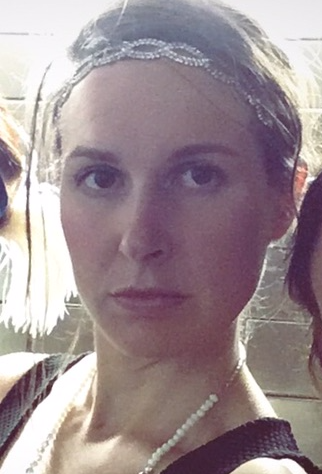

You look like a...


Here, they look like this:


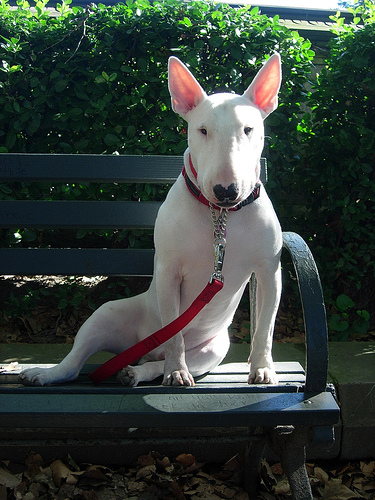

Are you guys cousins?

>>> DEBUG: #2 image name = 'me early 2014.jpg' <<<
¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯
You're not a dog, you're a human! I thought I was looking at dogs today...


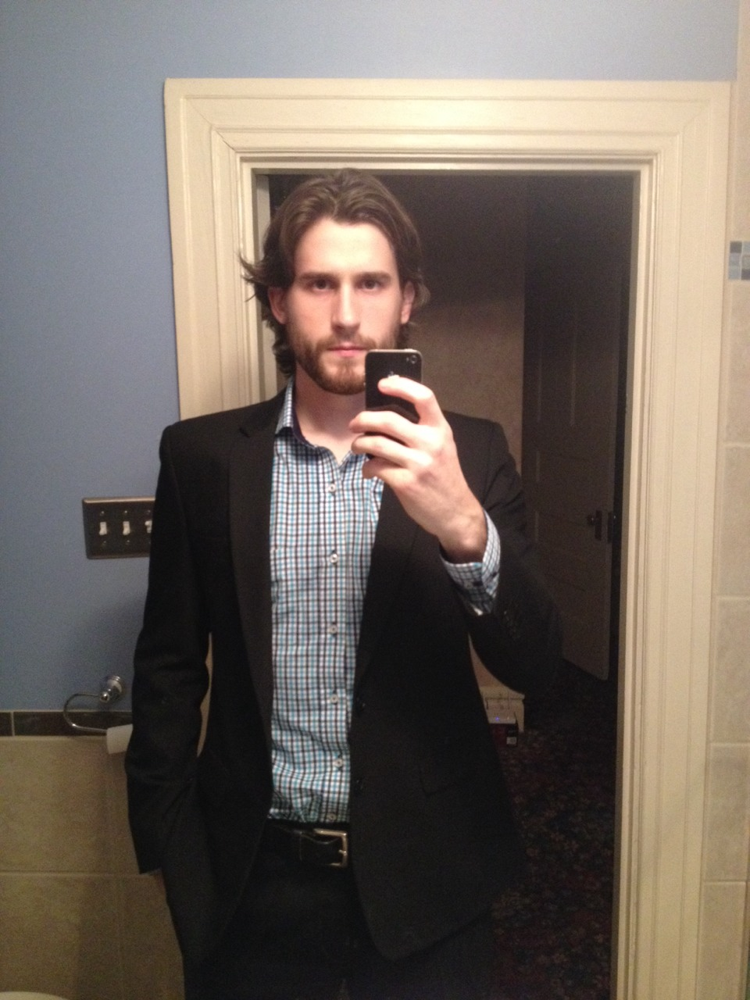

You look like a...


Here, they look like this:


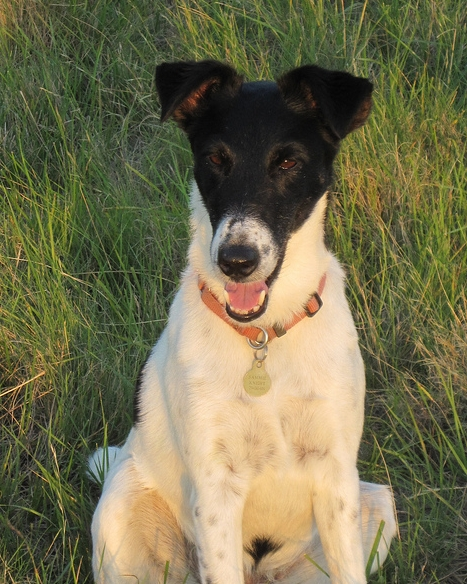

Are you guys cousins?

>>> DEBUG: #3 image name = 'profile linkedin.jpg' <<<
¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯
You're not a dog, you're a human! I thought I was looking at dogs today...


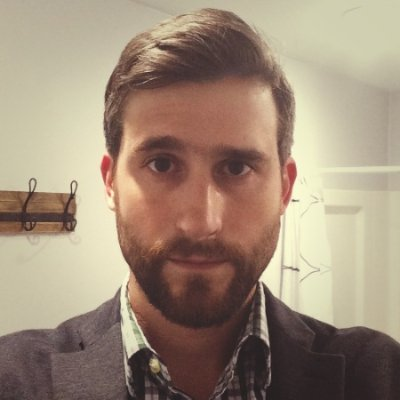

You look like a...


Here, they look like this:


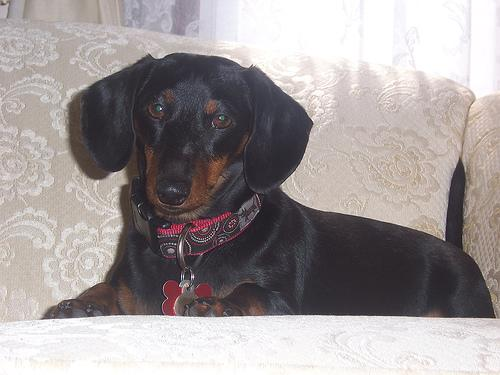

Are you guys cousins?

>>> DEBUG: #4 image name = 'chihuahua - lima.jpg' <<<
¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯
I'm seeing double, there's a dog AND a human in the picture? Regardless...


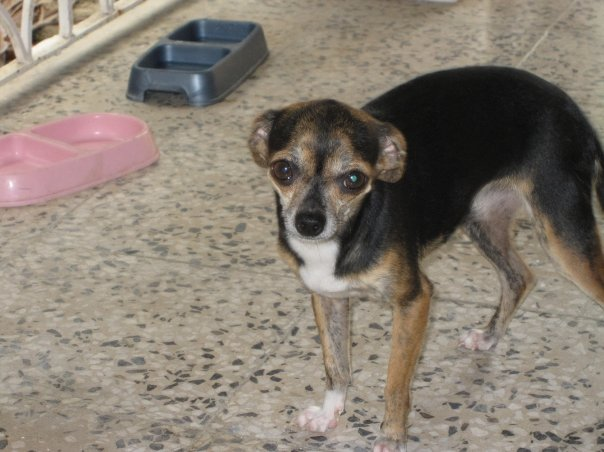

You look like a...


Here, they look like this:


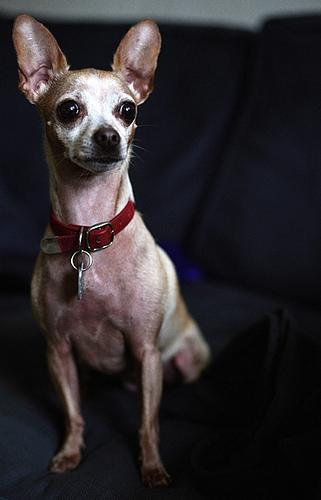

Are you guys cousins?

>>> DEBUG: #5 image name = 'golden - watson.jpeg' <<<
¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯
I'm seeing double, there's a dog AND a human in the picture? Regardless...


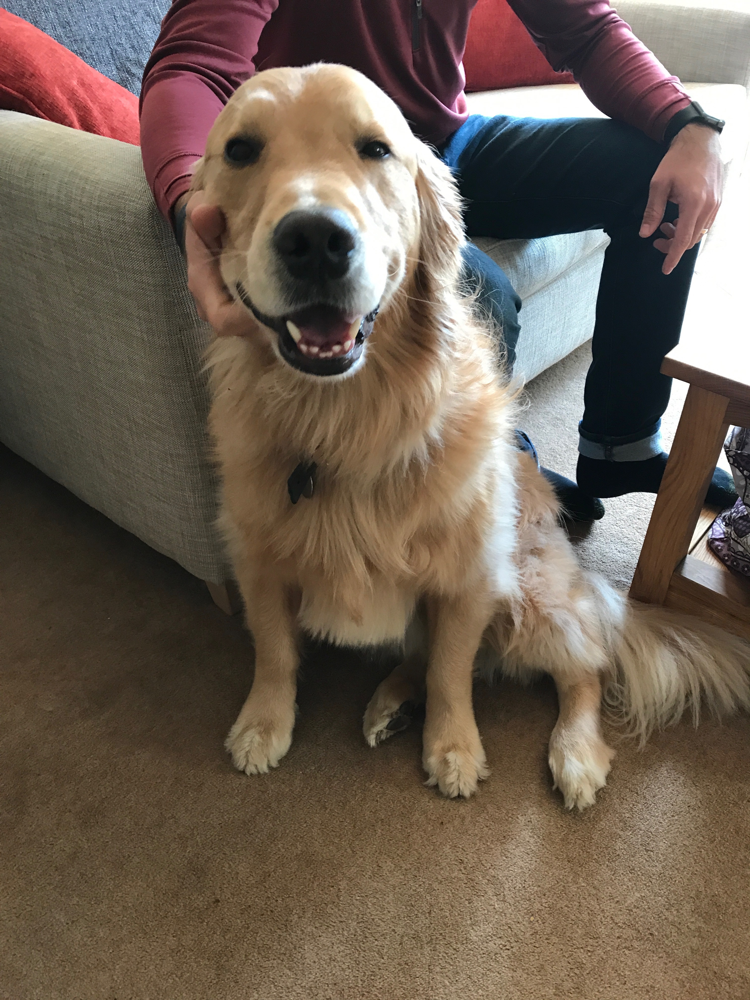

You look like a...


Here, they look like this:


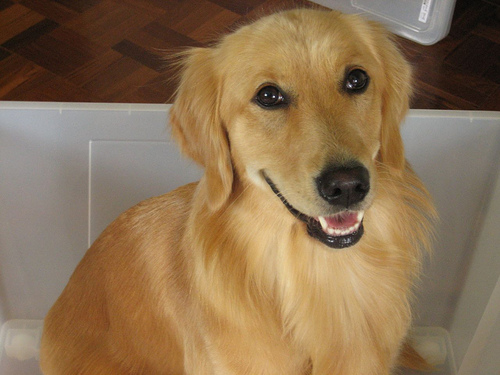

Are you guys cousins?

>>> DEBUG: #6 image name = 'kara.jpg' <<<
¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯
You're not a dog, you're a human! I thought I was looking at dogs today...


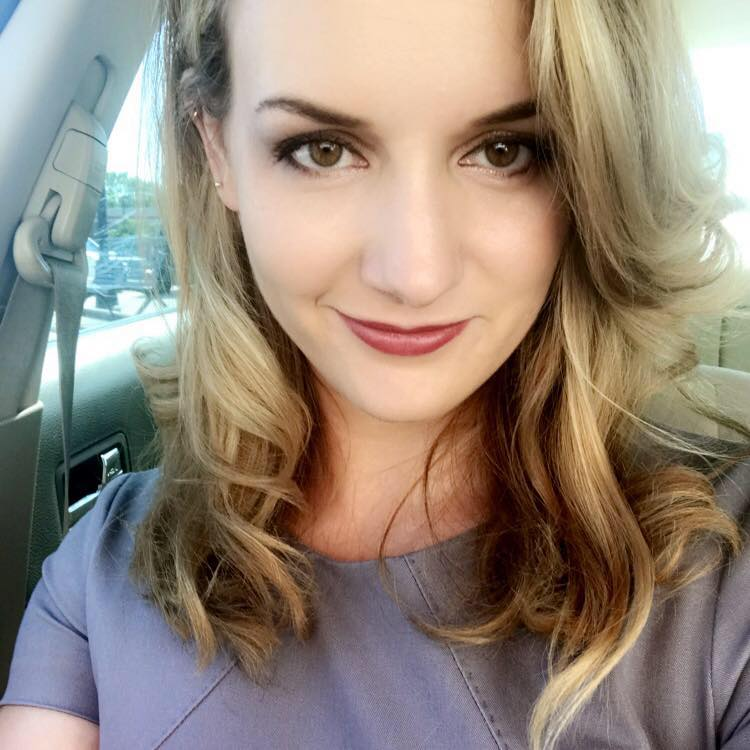

You look like a...


Here, they look like this:


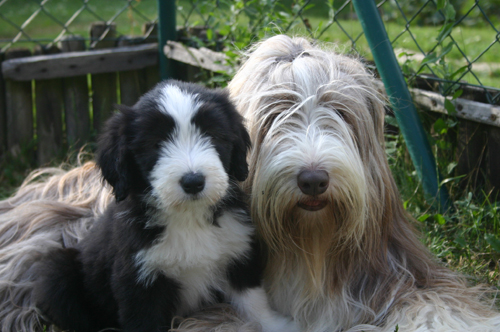

Are you guys cousins?

>>> DEBUG: #7 image name = 'andi oxford.png' <<<
¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯
You're not a dog, you're a human! I thought I was looking at dogs today...


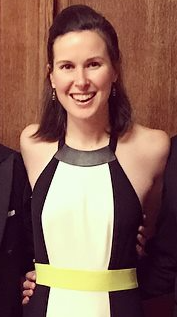

You look like a...


Here, they look like this:


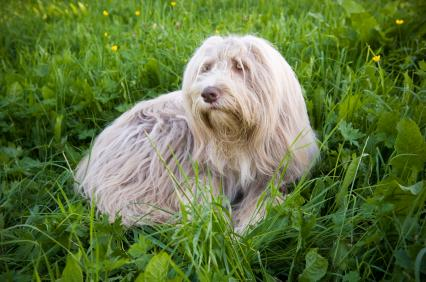

Are you guys cousins?

>>> DEBUG: #8 image name = 'mom 2017.png' <<<
¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯
No dog or human detected! I'm confused or you're trying to confuse me!


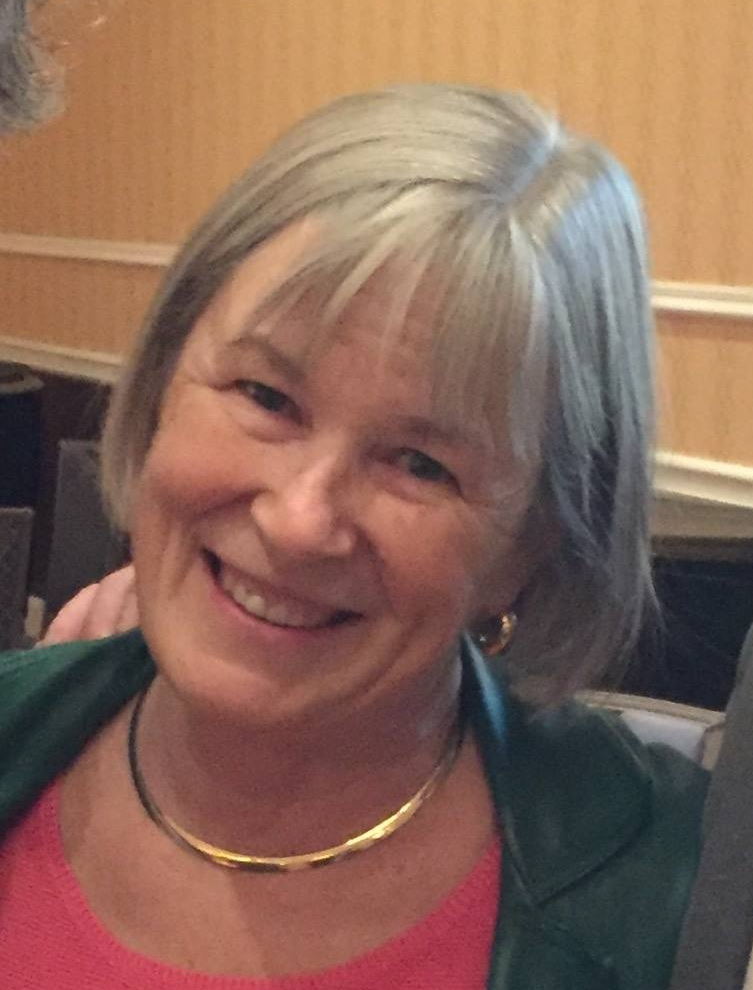


>>> DEBUG: #9 image name = 'colleen.png' <<<
¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯
No dog or human detected! I'm confused or you're trying to confuse me!


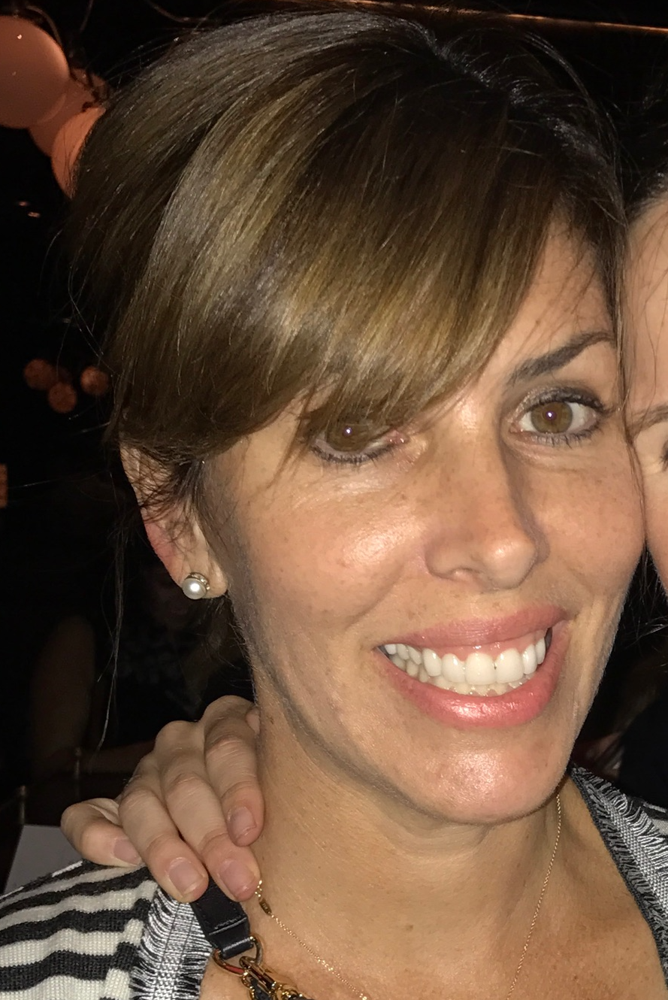


>>> DEBUG: #10 image name = 'tom selleck.jpg' <<<
¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯
You're not a dog, you're a human! I thought I was looking at dogs today...


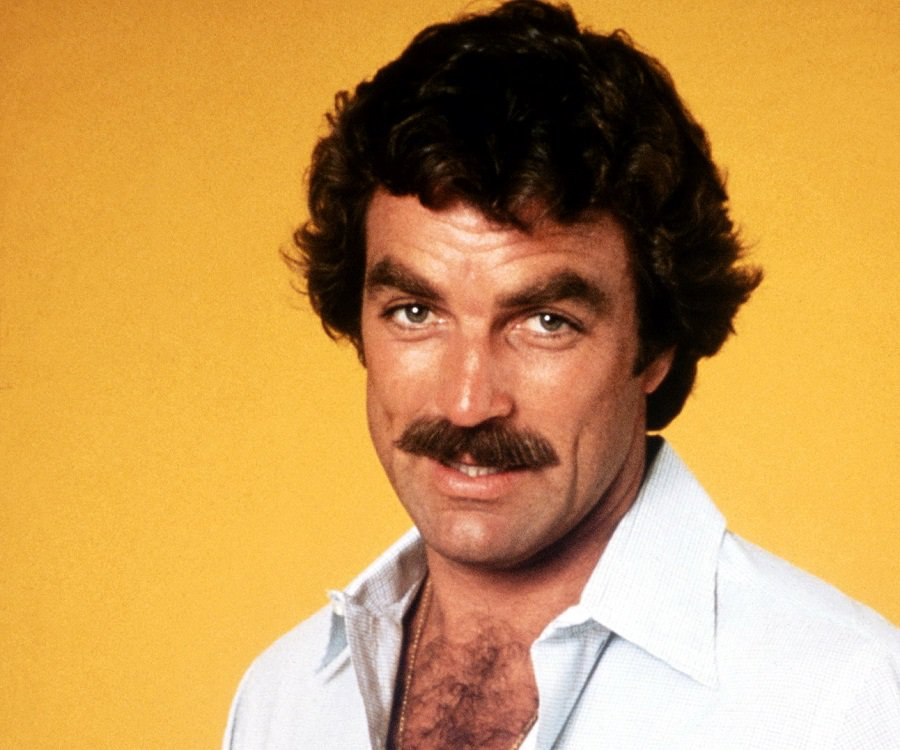

You look like a...


Here, they look like this:


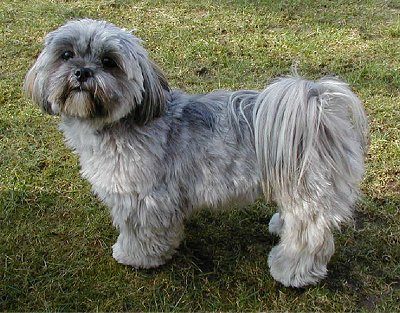

Are you guys cousins?

>>> DEBUG: #11 image name = 'dad wc 2017.png' <<<
¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯
You're not a dog, you're a human! I thought I was looking at dogs today...


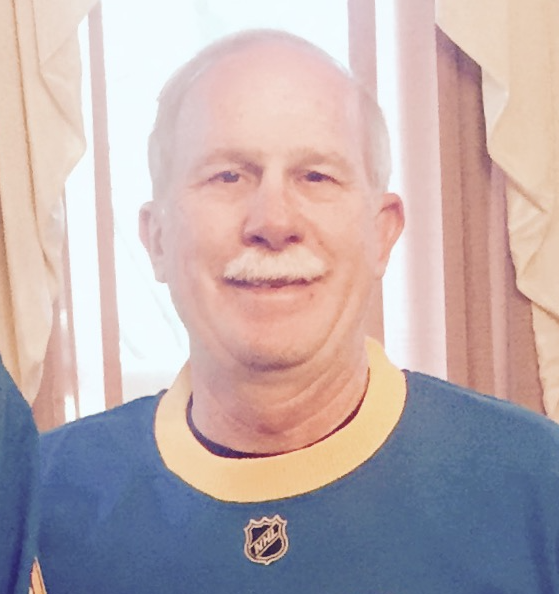

You look like a...


Here, they look like this:


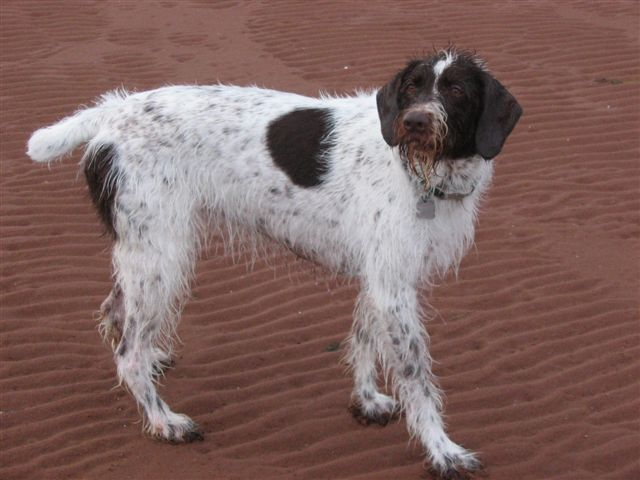

Are you guys cousins?

>>> DEBUG: #12 image name = 'colleen and juan.png' <<<
¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯
No dog or human detected! I'm confused or you're trying to confuse me!


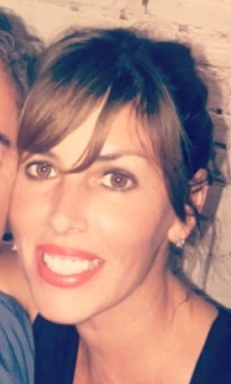


>>> DEBUG: #13 image name = 'juan and colleen.png' <<<
¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯
You're not a dog, you're a human! I thought I was looking at dogs today...


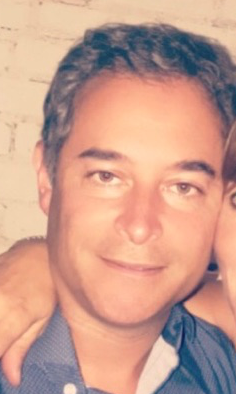

You look like a...


Here, they look like this:


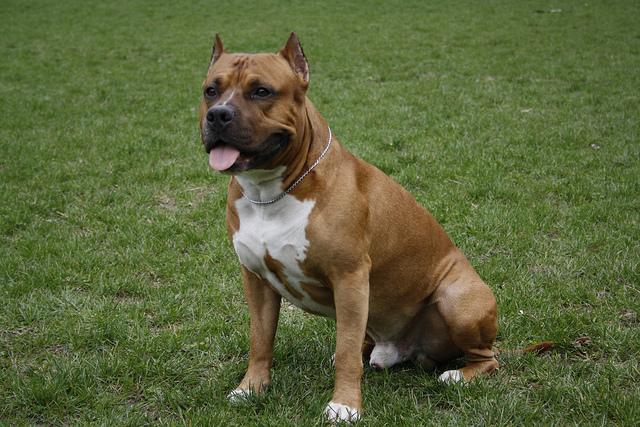

Are you guys cousins?

>>> DEBUG: #14 image name = 'me wc 2017.png' <<<
¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯
You're not a dog, you're a human! I thought I was looking at dogs today...


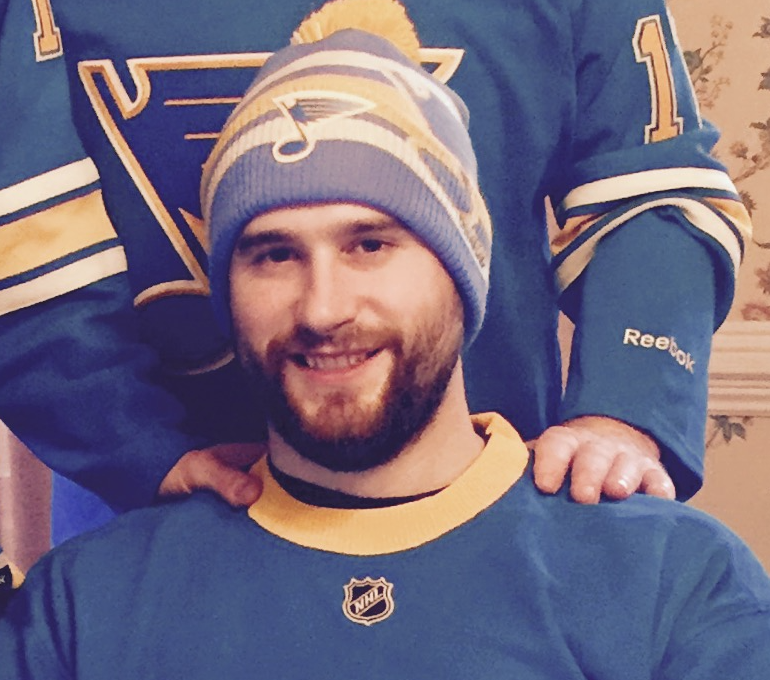

You look like a...


Here, they look like this:


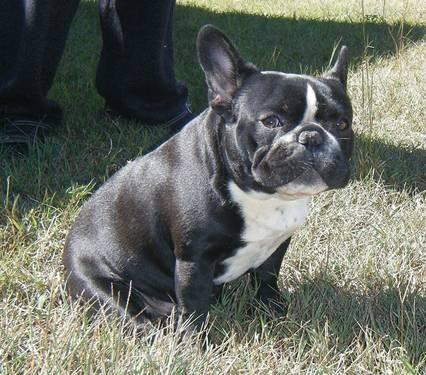

Are you guys cousins?

>>> DEBUG: #15 image name = 'kirk wc 2017.png' <<<
¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯
You're not a dog, you're a human! I thought I was looking at dogs today...


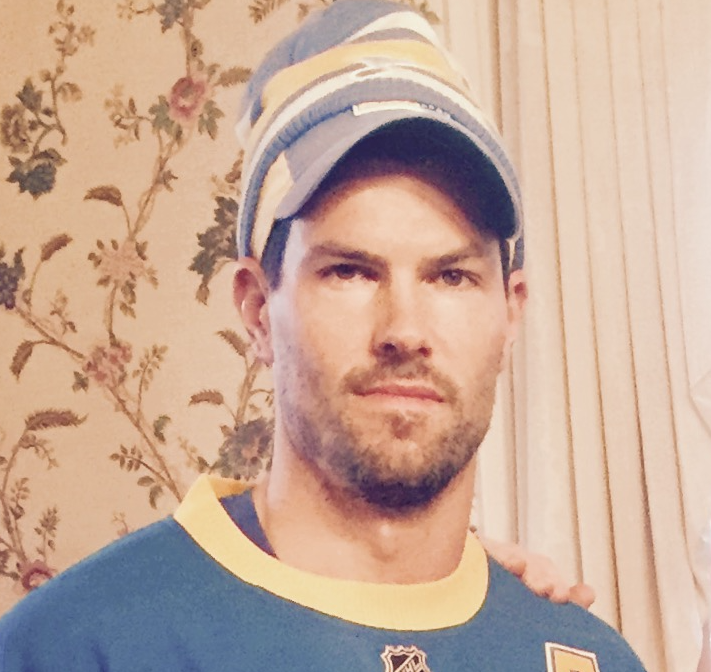

You look like a...


Here, they look like this:


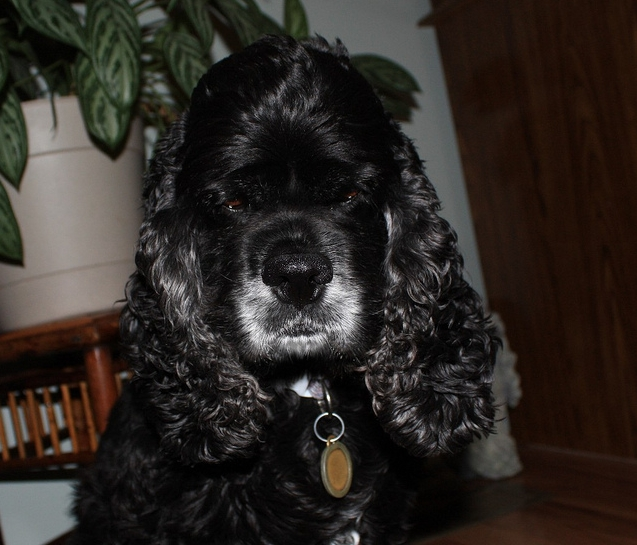

Are you guys cousins?



In [46]:
## TODO: Execute your algorithm from Step 6 on
## at least 6 images on your computer.
## Feel free to use as many code cells as needed.

test_images_dir = os.path.join(os.getcwd(), 'images', 'to_test')
for i, img_name in enumerate(os.listdir(test_images_dir)):
    debug_str = ">>> DEBUG: #{} image name = '{}' <<<".format(i+1, img_name)
    print(debug_str)
    print('¯'*len(debug_str))
    img_path = os.path.join(test_images_dir, img_name)
    decider(img_path)
    print()